In [ ]:
########################################################################
# Author    : A. Alsema
# Date      : May-July 2021
# Dataset   : Visium Spatial Transcriptomics for MS lesions
# Purpose   : Scale data, run PCA and determine the optimal clustering resolution
# Required input: "2.WM.integrated_scaled_filtered_filtered.rds"
#########################################################################

In [ ]:
rm(list = ls())

library(Seurat)
library(hdf5r)
library(ggplot2)
library(patchwork)
library(future)
library(dplyr)
library(RColorBrewer)
# Enable parallelization
options(future.globals.maxSize = 16000 * 1024^2, future.seed = TRUE)
plan("multicore", workers = 25)

ggplot.theme <- theme(aspect.ratio = 1,
                    text = element_text(hjust = 0.5, face = "plain", size = (9)),
                    plot.title = element_text(hjust = 0.5, face = "plain", size = (10)),
                    axis.title.x = element_text(face = "plain", size = (12)),
                    axis.title.y = element_text(face = "plain", size = (12)),
                    axis.text = element_text(face = "plain", size = (12), colour = "black"),
#                     axis.text.x = element_text(angle = 90, vjust=0.5, hjust=1),
                    plot.subtitle = element_text(hjust = 0.5),
                    panel.background = element_blank(),
                    panel.border = element_blank(),
                    panel.grid.major = element_blank(), panel.grid.minor = element_blank(),
                    panel.grid = element_blank(),
                    axis.line = element_line(color = "black"),
                    plot.background = element_rect(fill="transparent", color=NA),
                    legend.key = element_rect(fill="transparent", color="transparent"),
                    legend.box.background = element_rect(fill="transparent", color="transparent"),
                    legend.background = element_rect(fill="transparent", color="transparent"),
                    legend.text=element_text(size=10), 
                    legend.title = element_text(size=10))

In [ ]:
################################## prepare data -- only once ##################################
st.integrated <- readRDS("./RData/seurat/2.WM.integrated_scaled_filtered_filtered.rds")

# Dim Red

In [ ]:
# scale data again
gc()
st.integrated <- ScaleData(st.integrated, vars.to.regress = c("nFeature_Spatial")) # tested but NOT useful vars.to.regress = c("nCount_Spatial"). 

saveRDS(st.integrated, file = "./RData/seurat/2.WM.integrated_scaled_filtered_filtered_intermediate.rds")
# Run PCA
DefaultAssay(st.integrated) <- "integrated"
gc()
st.integrate <- RunPCA(st.integrated)
ElbowPlot(st.integrated, ndims = 50)

In [98]:
# some custom colors for the group
group_cols <- c("#80C280", "#B36F9F", "#FF4D4D", "#FFB55E")
names(group_cols) <- levels(st.integrated$Group) # important for the PCA plot in figure 1c!
group_cols

CWM      NAWM    active act/inact 
"#80C280" "#B36F9F" "#FF4D4D" "#FFB55E"

In [ ]:
dir.create("Routput/Seurat/R_QC", recursive = TRUE)
dir.create("Routput/Seurat/Clustering/umaps", recursive = TRUE)

## optional QC plots

In [ ]:
x <- table(st.integrated$sample_ID)
x
tiff('./Routput/Seurat/Clustering/spots analysed per sample.tiff')
plot(x, las = 2, ylab = "spots analysed")
dev.off()
write.csv(x, "./Routput/Seurat/Clustering/spots analysed per sample.csv")

x <- table(st.integrated$sample_name)
tiff('./Routput/Seurat/Clustering/spots analysed per donor.tiff')
plot(x, las = 2, ylab = "spots analysed")
dev.off()
write.csv(x, "./Routput/Seurat/Clustering/spots analysed per donor.csv")

In [ ]:
print('average spots per ST sample ID:')
print(mean(table(st.integrated$sample_ID)))
print('total spots analysed')
print(ncol(st.integrated))

In [101]:
tiff("Routput/Seurat/R_QC/QC_cor_brainpH_RIN.tiff", units = "in", res = 300, height = 10, width = 10)
FeatureScatter(st.integrated, feature1 = "RIN", feature2 = 'brain_pH')
dev.off()

p1 <- VlnPlot(st.integrated, features = "nCount_Spatial", group.by = "manuscript_ID", pt.size = 0) 
p1 <- p1 + stat_summary(fun = mean, geom = "point", size = 2, color = 'black') + NoLegend() + 
                ggtitle("Counts per ST sample") 

p2 <- VlnPlot(st.integrated, features = "nCount_Spatial", group.by = "Group", pt.size = 0, 
              cols = group_cols) 
p2 <- p2 + stat_summary(fun = mean, geom = "point", size = 2, color = 'black') + NoLegend() + 
                ggtitle("Counts per Group")

p3 <- VlnPlot(st.integrated, features = "nCount_Spatial", group.by = "slide", pt.size = 0) 
p3 <- p3 + stat_summary(fun = mean, geom = "point", size = 2, color = 'black') + NoLegend() + 
                ggtitle("Counts per slide")

p4 <- VlnPlot(st.integrated, features = "nCount_Spatial", group.by = "sample_name", pt.size = 0) 
p4 <- p4 + stat_summary(fun = mean, geom = "point", size = 2, color = 'black') + NoLegend() + 
                ggtitle("Counts per donor")

pdf("Routput/Seurat/R_QC/nCount_QC.pdf", width = 7, height = 7)
wrap_plots(p1,p2,p3,p4, ncol = 2)
dev.off()

tiff("Routput/Seurat/R_QC/QC_plots_slide.tiff", units = "in", res = 300, height = 10, width = 10)
VlnPlot(st.integrated, features = c("nCount_Spatial", "nFeature_Spatial", "percent.mito", "percent.ribo"), ncol = 2, 
        group.by = "slide", pt.size = 0)
dev.off()

tiff("Routput/Seurat/R_QC/QC_plots_donors.tiff", units = "in", res = 300, height = 10, width = 10)
VlnPlot(st.integrated, features = c("nCount_Spatial", "nFeature_Spatial", "percent.mito", "percent.ribo"), ncol = 2, 
        group.by = "sample_name", pt.size = 0)
dev.off()

tiff("Routput/Seurat/R_QC/QC_plots_samples.tiff", units = "in", res = 300, height = 10, width = 10)
VlnPlot(st.integrated, features = c("nCount_Spatial", "nFeature_Spatial", "percent.mito", "percent.ribo"), ncol = 2, 
        group.by = "manuscript_ID", pt.size = 0)
dev.off()

png 
  2

png 
  2

png 
  2

png 
  2

png 
  2

In [ ]:
## make a nicer plot of the possible relation between RIN and nFeature/nCount

meta_full <- st.integrated@meta.data
meta_full$sample_ID <- as.character(meta_full$sample_ID)
require(dplyr)
meta_avg <- meta_full %>%
  group_by(sample_ID) %>%# Specify group indicator 
  summarise_at(vars(nCount_Spatial, nFeature_Spatial, percent.mito), 
               list(mean = mean)
               )  
meta_avg$RIN <- st.integrated@meta.data$RIN[!duplicated(st.integrated@meta.data$sample_ID)] 

print("Pearson correlation between RIN and average UMI count")
cor(meta_avg$RIN, meta_avg$nCount_Spatial_mean, method = "pearson")
print("Pearson correlation between RIN and average nr of detected genes")
cor(meta_avg$RIN, meta_avg$nFeature_Spatial_mean)
print("Pearson correlation between RIN and average percent mito")
cor(meta_avg$RIN, meta_avg$percent.mito_mean)

require(ggplot2)
pdf("Routput/Seurat/R_QC/QC_plot RIN.pdf")
ggplot(meta_avg, aes(x=RIN, y=nCount_Spatial_mean)) +
  geom_point(size=2, shape=23) + 
  ggplot.theme +
  geom_smooth(method=lm) +
  ylab("average UMI_counts") +
  scale_x_continuous(breaks = seq(6,9,1), limits=c(6, 9))

ggplot(meta_avg, aes(x=RIN, y=nFeature_Spatial_mean)) +
  geom_point(size=2, shape=23) + 
  ggplot.theme +
  geom_smooth(method=lm) +
  ylab("average nr of detected genes") +
  scale_x_continuous(breaks = seq(6,9,1), limits=c(6, 9))

ggplot(meta_avg, aes(x=RIN, y=percent.mito_mean)) +
  geom_point(size=2, shape=23) + 
  ggplot.theme +
  geom_smooth(method=lm) +
  ylab("average percent of mitochondrial transcripts") +
  scale_x_continuous(breaks = seq(6,9,1), limits=c(6, 9))
dev.off()

## better RIN value seems to correlate with lower % of mitochondrial transcripts

## 2. PCA plots

In [ ]:
table(st.integrated$Group)

In [99]:
pdf("Routput/Seurat/Clustering/PCA_WM_geneloadings.pdf", width = 10, height = 20)
VizDimLoadings(st.integrated, dims = 1:6, reduction = "pca")
dev.off()


pdf('Routput/Seurat/Clustering/pca_WM_group.pdf')
DimPlot(st.integrated, reduction = "pca", group.by = "Group", order = c("CWM", "NAWM", "active", "act/inact"), cols = group_cols, dims = c(1,2))
DimPlot(st.integrated, reduction = "pca", group.by = "Group", order = c("CWM", "NAWM", "active", "act/inact"), cols = group_cols, dims = c(1,3))
dev.off()


pdf('Routput/Seurat/Clustering/pca_WM_donors.pdf')
DimPlot(st.integrated, reduction = "pca", group.by = "sample_name", dims = c(1,2))
dev.off()

pdf('Routput/Seurat/Clustering/pca_WM_slide.pdf')
DimPlot(st.integrated, reduction = "pca", group.by = "slide", dims = c(1,2))
dev.off()

png 
  2

png 
  2

png 
  2

png 
  2

## 3. Clustering

In [ ]:
# # find resolution options - only once
ndims = 20
k.parameter = 20
spots <- st.integrated

k = 1
n.clusters = NULL
for (i in seq(from = 0.1, to = 1.0, by = 0.1)){
    spots = FindNeighbors(spots, dims = 1:ndims, k.param = k.parameter) 
    spots = FindClusters(spots, resolution = i)
    n.clusters[k] = length(levels(spots$seurat_clusters))
    k = k + 1
}

# plot resolution options
df <- as.data.frame(n.clusters)
df$res <- seq(from = 0.1, to = 1.0, by = 0.1)
tiff("Routput/Seurat/Clustering/WM_Resolutions.tiff")
ggplot(df, aes(x= res, y = n.clusters)) +
    geom_point(size = 6, shape = 4) +
    scale_x_continuous(breaks = seq(from = 0, to = 1.0, by = 0.1)) +
    theme_minimal()
dev.off()

In [54]:
########################################################################
#			          UMAP  & Clustering                               #
########################################################################
# this part was repeated until i found the right settings (indicated below)
st.integrated <- readRDS(file = "./RData/seurat/2.WM.integrated_scaled_filtered_filtered_intermediate.rds")
set.seed(1234)
ndims = 20
k.parameter = 20
res = 0.2 # chosen resolution
DefaultAssay(st.integrated) <- "integrated"

datasets <- FindNeighbors(object = st.integrated, dims = 1:ndims, k.param = k.parameter) 
datasets <- FindClusters(object = datasets, resolution = res, future.seed = TRUE)
datasets <- RunUMAP(datasets, dims = 1:ndims, verbose = F)

Computing nearest neighbor graph

Computing SNN

Warning message:
“The following arguments are not used: future.seed”
Warning message:
“The following arguments are not used: future.seed”


Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 55519
Number of edges: 1475756

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9015
Number of communities: 8
Elapsed time: 13 seconds


2 singletons identified. 6 final clusters.

Warning message:
“UNRELIABLE VALUE: One of the ‘future.apply’ iterations (‘future_lapply-1’) unexpectedly generated random numbers without declaring so. There is a risk that those random numbers are not statistically sound and the overall results might be invalid. To fix this, specify 'future.seed=TRUE'. This ensures that proper, parallel-safe random numbers are produced via the L'Ecuyer-CMRG method. To disable this check, use 'future.seed = NULL', or set option 'future.rng.onMisuse' to "ignore".”


In [55]:
print(paste('we found' , length(levels(datasets@active.ident)), 'clusters' ))
table(datasets$seurat_clusters)

[1] "we found 6 clusters"



    0     1     2     3     4     5 
22924 17376  5984  4807  4007   421 

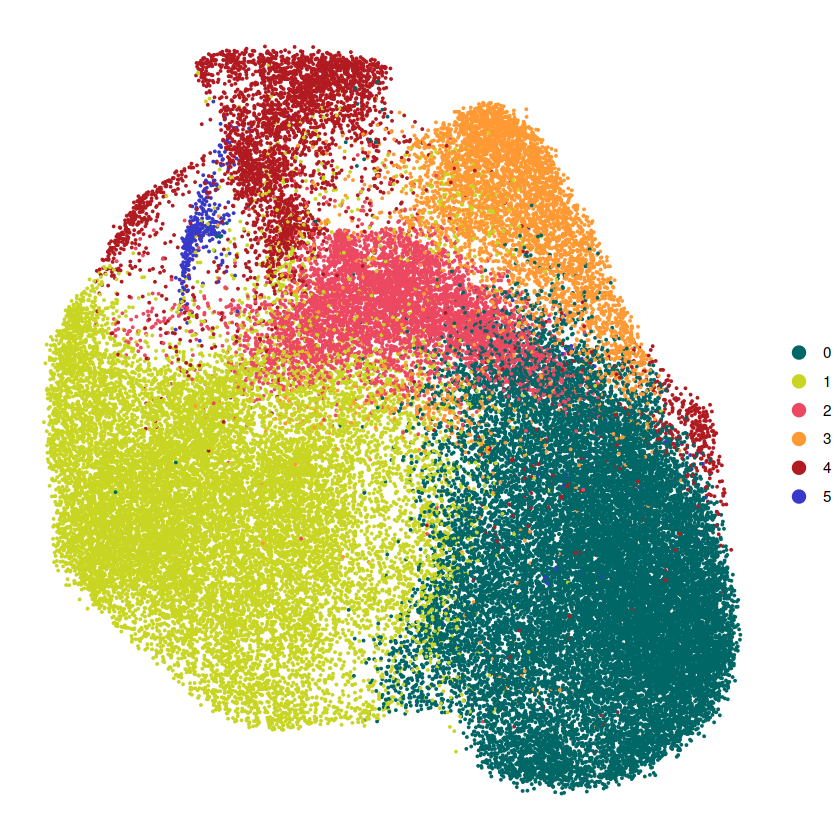

In [79]:
#--------------------- umap colors ---------------------
ucols <- c("#006666", "#C8D523",  "#EC4861","#FF9933", "#B11A20", "#3838c9")

names(ucols) <- levels(datasets@active.ident)

DimPlot(datasets, label = F, cols = ucols) + theme_void()

In [80]:
png("Routput/Seurat/Figures/UMAP-fig1.png")
DimPlot(datasets, label = F, pt.size = 0.6, cols = ucols) + theme_void()
dev.off()

png 
  2

In [81]:
tiff("Routput/Seurat/Figures/UMAP-fig1.tiff")
DimPlot(datasets, label = F, pt.size = 0.6, cols = ucols) + theme_void()
dev.off()

png 
  2

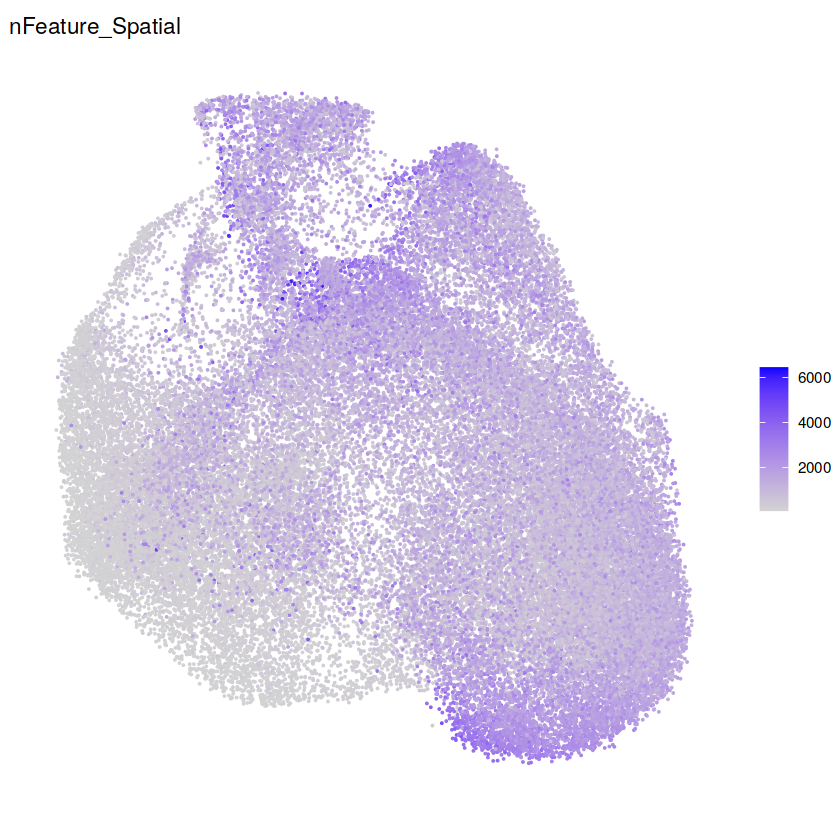

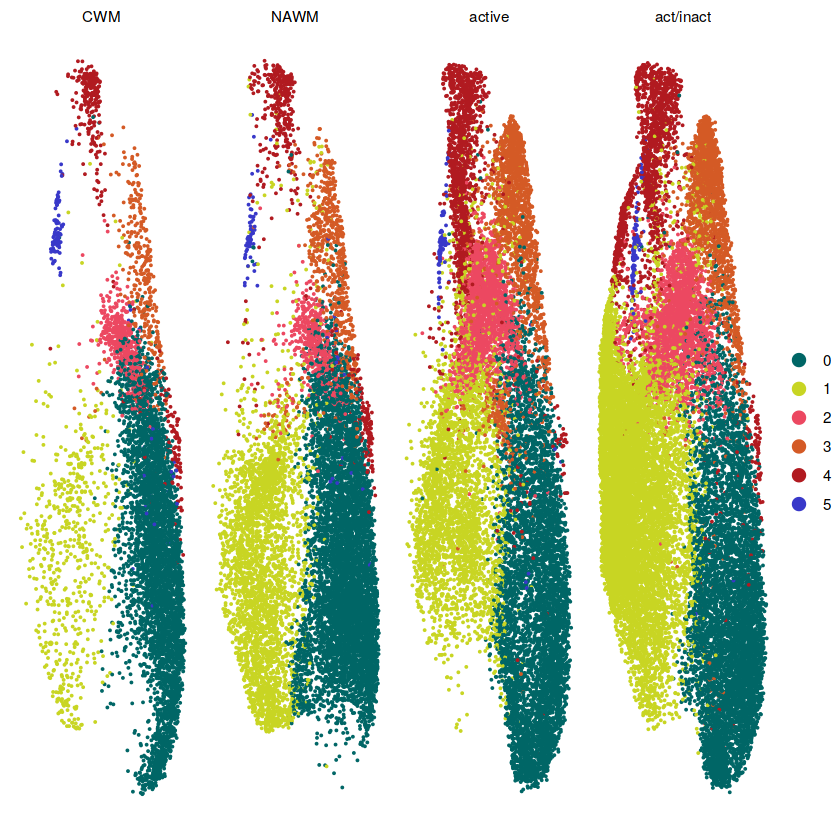

In [74]:
# investigate distribution of low nfeature spots in the clustering result
FeaturePlot(datasets, feature = "nFeature_Spatial")  + theme_void()
# conclusion, the umap segments with most mixed act/inact lesion cores and NAWM have low nFeature spots
DimPlot(datasets, split.by = "Group", cols = ucols)  + theme_void()

DefaultAssay(datasets) <- "Spatial"

Warning message:
“Removed 6 rows containing missing values (`geom_segment()`).”
Warning message:
“Removed 6 rows containing missing values (`geom_segment()`).”
Warning message:
“Removed 6 rows containing missing values (`geom_segment()`).”
Warning message:
“Removed 6 rows containing missing values (`geom_segment()`).”


png 
  2

Warning message:
“Removed 6 rows containing missing values (`geom_segment()`).”
Warning message:
“Removed 6 rows containing missing values (`geom_segment()`).”
Warning message:
“Removed 6 rows containing missing values (`geom_segment()`).”
Warning message:
“Removed 6 rows containing missing values (`geom_segment()`).”


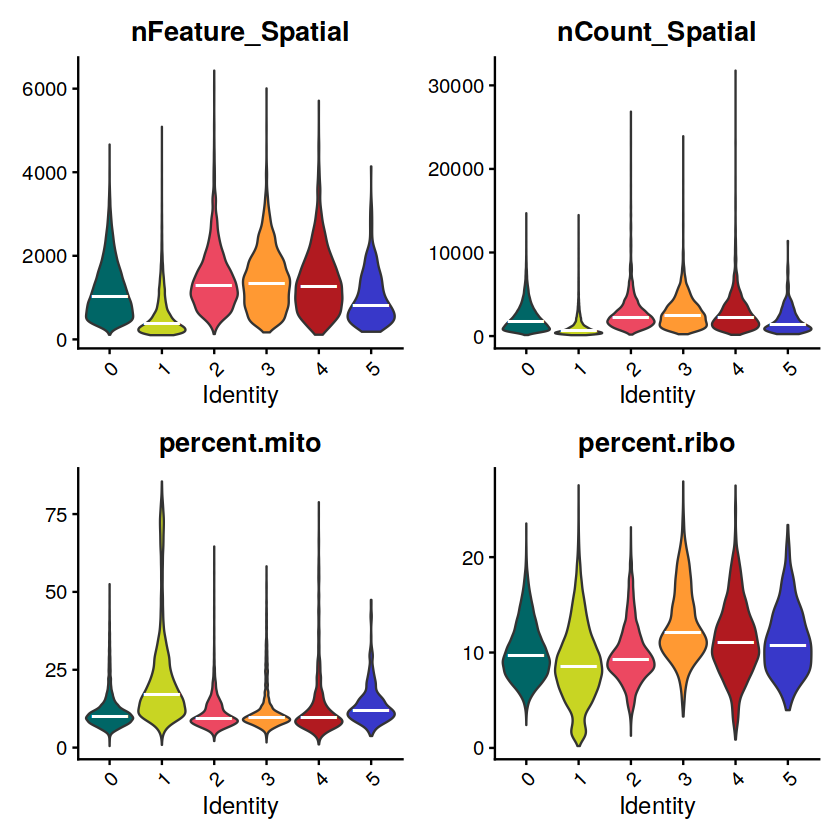

In [82]:
#######################################################################
#			          QC plots of clusters  	      		       #
#######################################################################
p1 <- VlnPlot(datasets, features = c('nFeature_Spatial'), pt.size = 0) # , y.max = 2000 ""
p1 <- p1 + 
        stat_summary(fun = median, shape = 95, size = 3, colour = 'white') +
        theme(legend.position = 'none') + 
        scale_fill_manual(values = ucols)

p2 <- VlnPlot(datasets, features = c('nCount_Spatial'), pt.size = 0) # ""
p2 <- p2 + 
        stat_summary(fun = median, shape = 95, size = 3, colour = 'white') +
        theme(legend.position = 'none') + 
        scale_fill_manual(values = ucols)

p3 <- VlnPlot(datasets, features = c('percent.mito'), pt.size = 0) # ""
p3 <- p3 + 
        stat_summary(fun = median, shape = 95, size = 3, colour = 'white') +
        theme(legend.position = 'none') + 
        scale_fill_manual(values = ucols)

p4 <- VlnPlot(datasets, features = c('percent.ribo'), pt.size = 0) # ""
p4 <- p4 + 
        stat_summary(fun = median, shape = 95, size = 3, colour = 'white') +
        theme(legend.position = 'none') + 
        scale_fill_manual(values = ucols)
pdf("Routput/Seurat/Clustering/WM_plots_nFeature_nCount_per_cluster.pdf")
wrap_plots(p1, p2, p3, p4)
dev.off()
wrap_plots(p1, p2, p3, p4)

In [123]:
#-------------------------- Final checks: Do sample variables influence clustering? --------------------------

tiff("./Routput/Seurat/Clustering/Violin_clusters_RIN.tiff", units = "in", res = 300, height = 5, width = 10)
p <- VlnPlot(datasets, features = c('RIN'), pt.size = 0) # ""
p <- p + 
        stat_summary(fun = median, shape = 95, size = 5, colour = 'white') +
        theme(legend.position = 'none') + 
        scale_fill_manual(values = ucols)
p
dev.off()

tiff("./Routput/Seurat/Clustering/Violin_clusters_Age.tiff", units = "in", res = 300, height = 5, width = 10)
p <- VlnPlot(datasets, features = c('Age'), pt.size = 0) # ""
p <- p + 
        stat_summary(fun = median, shape = 95, size = 5, colour = 'white') +
        theme(legend.position = 'none') + 
        scale_fill_manual(values = ucols)
p
dev.off()

tiff("./Routput/Seurat/Clustering/Violin_clusters_PMI.tiff", units = "in", res = 300, height = 5, width = 10)
p <- VlnPlot(datasets, features = c('PMI_min'), pt.size = 0) # ""
p <- p + 
        stat_summary(fun = median, shape = 95, size = 5, colour = 'white') +
        theme(legend.position = 'none') + 
        scale_fill_manual(values = ucols)
p
dev.off()


Warning message:
“Removed 6 rows containing missing values (`geom_segment()`).”


png 
  2

Warning message:
“Removed 6 rows containing missing values (`geom_segment()`).”


png 
  2

Warning message:
“Removed 6 rows containing missing values (`geom_segment()`).”


png 
  2

[1] "done. Ready to save your final clustering choise?"


[1] "ST31_CWM"       "ST32_CWM"       "ST33_active"    "ST34_NAWM"     
 [5] "ST37_NAWM"      "ST38_NAWM"      "ST67_act/inact" "ST68_act/inact"
 [9] "ST69_active"    "ST70_active"    "ST71_act/inact" "ST72_act/inact"
[13] "ST73_act/inact" "ST74_act/inact" "ST79_active"

[1] 15

[1] 15

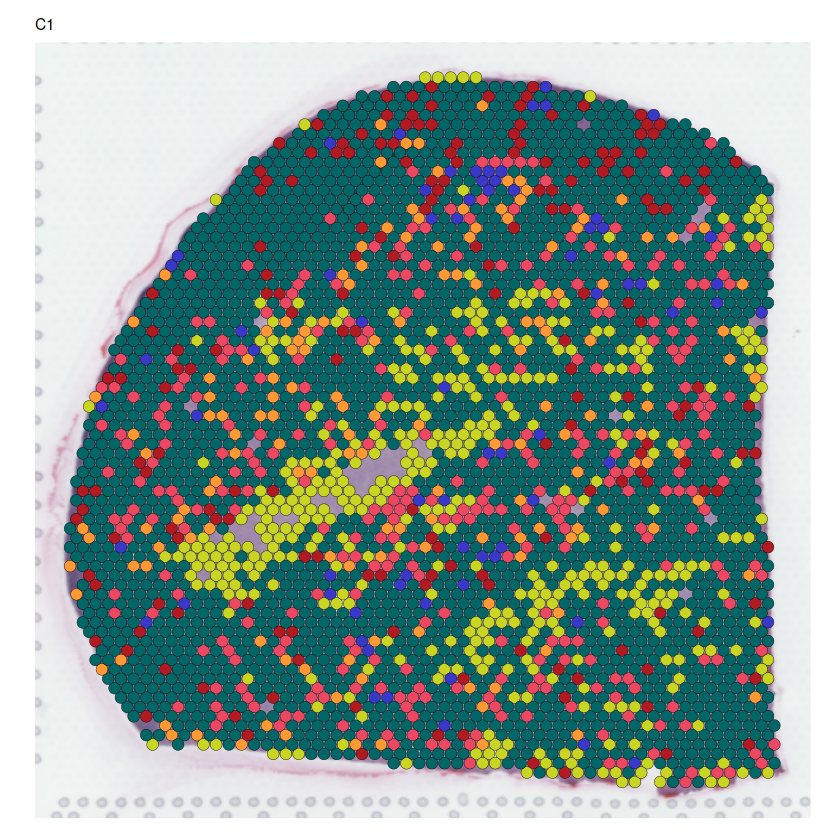

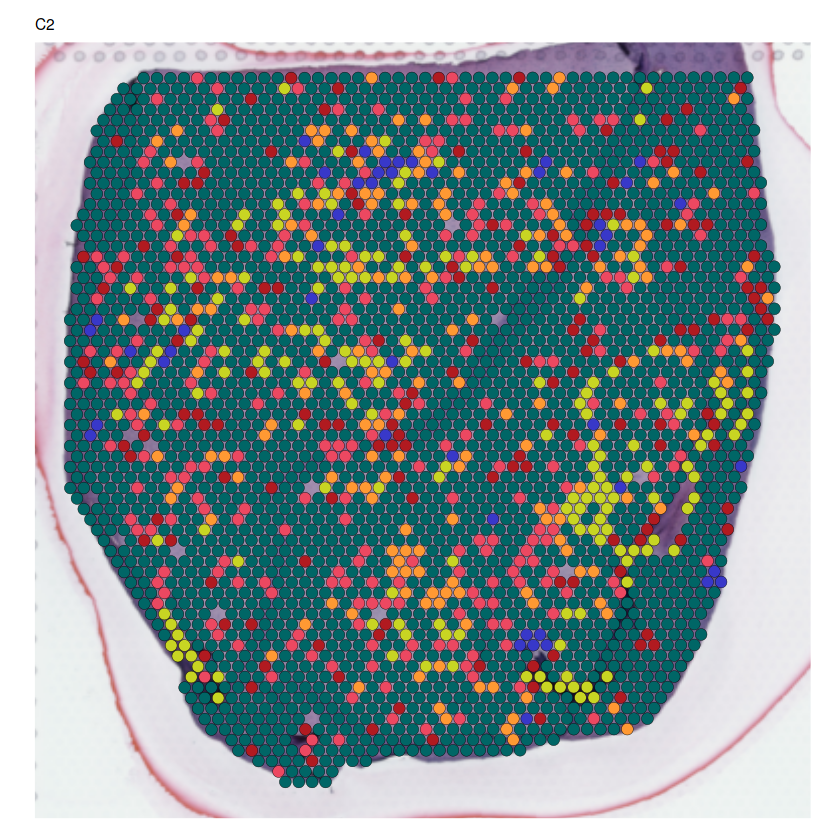

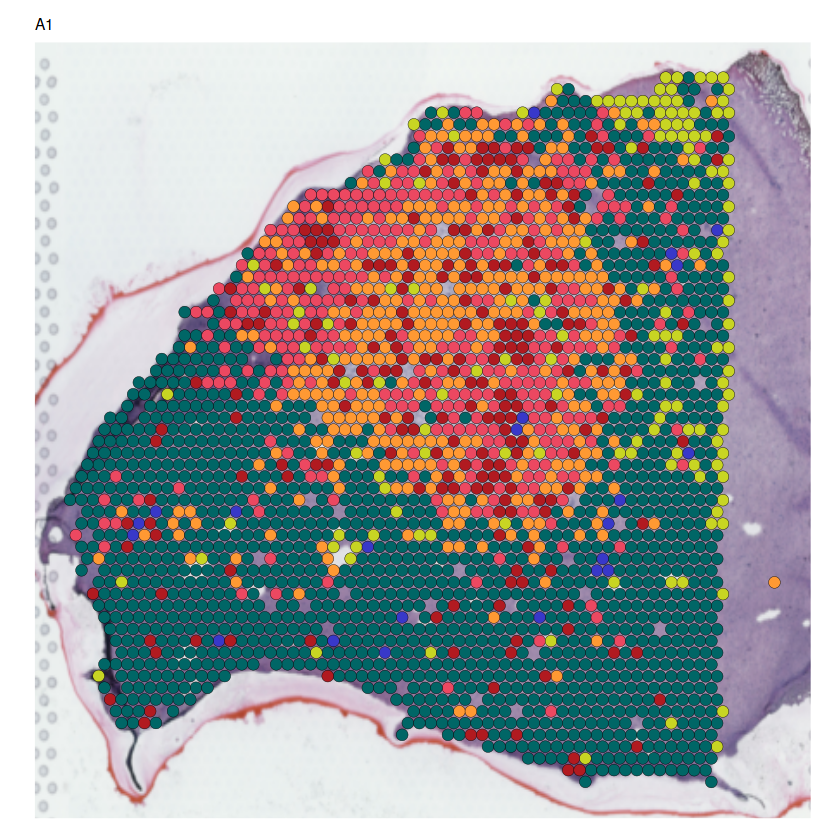

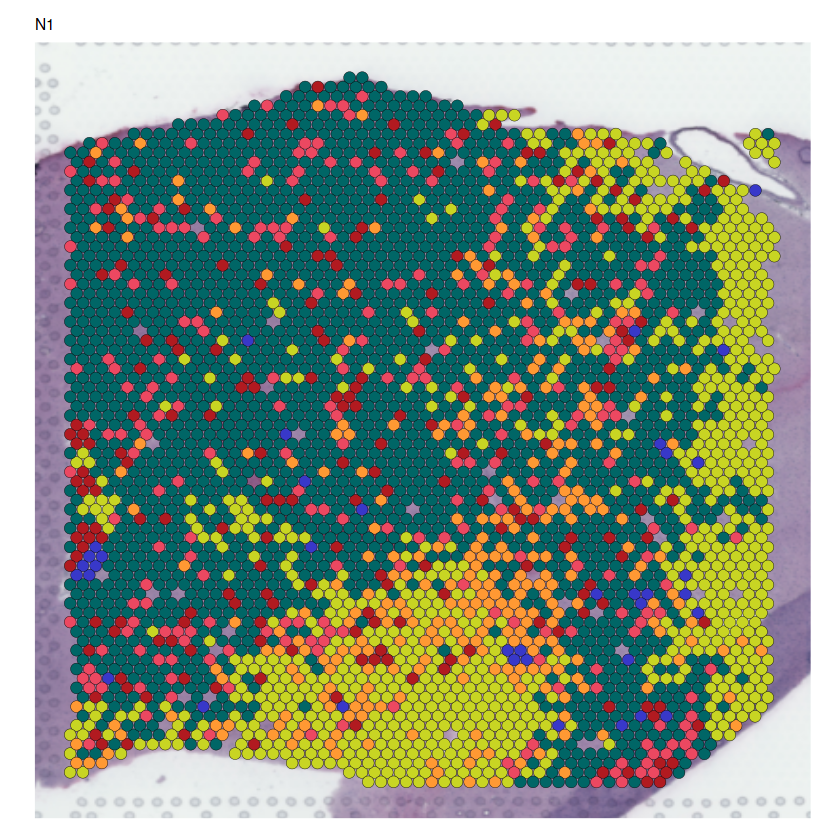

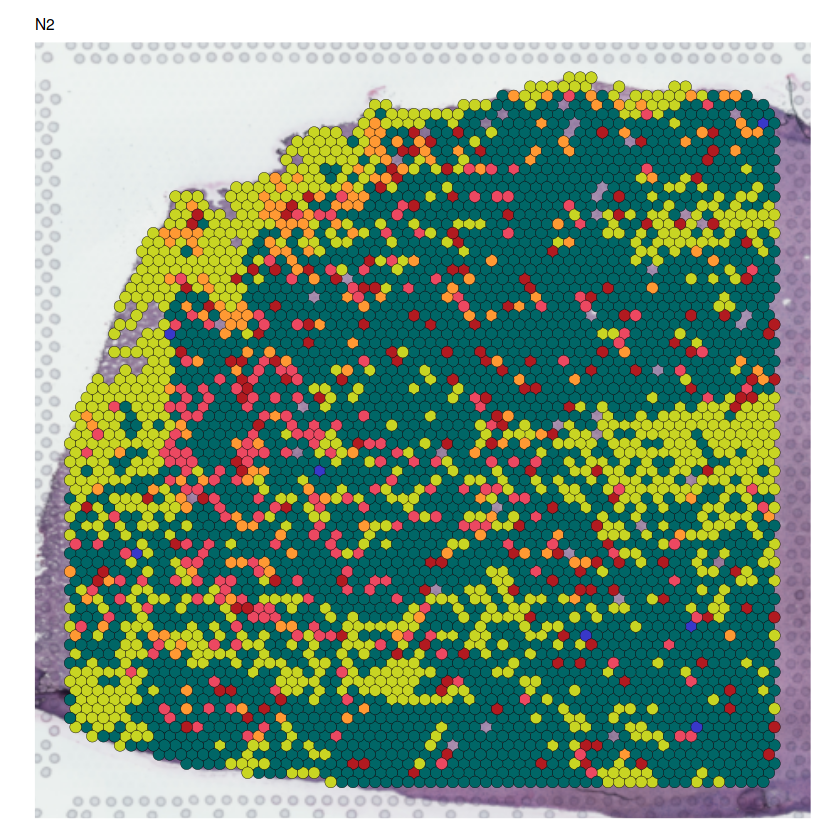

...

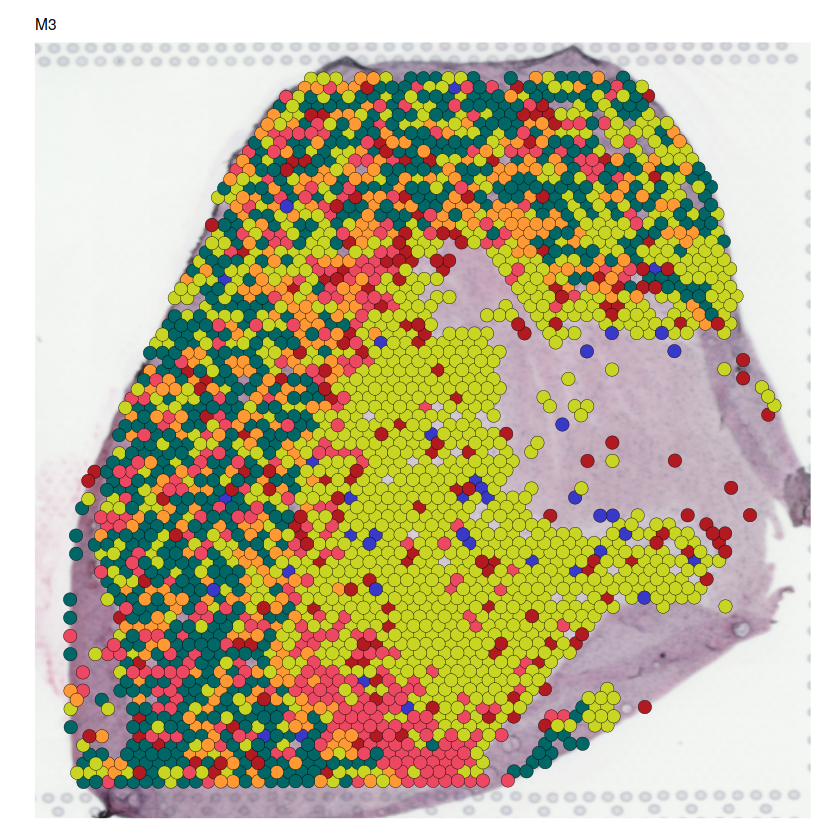

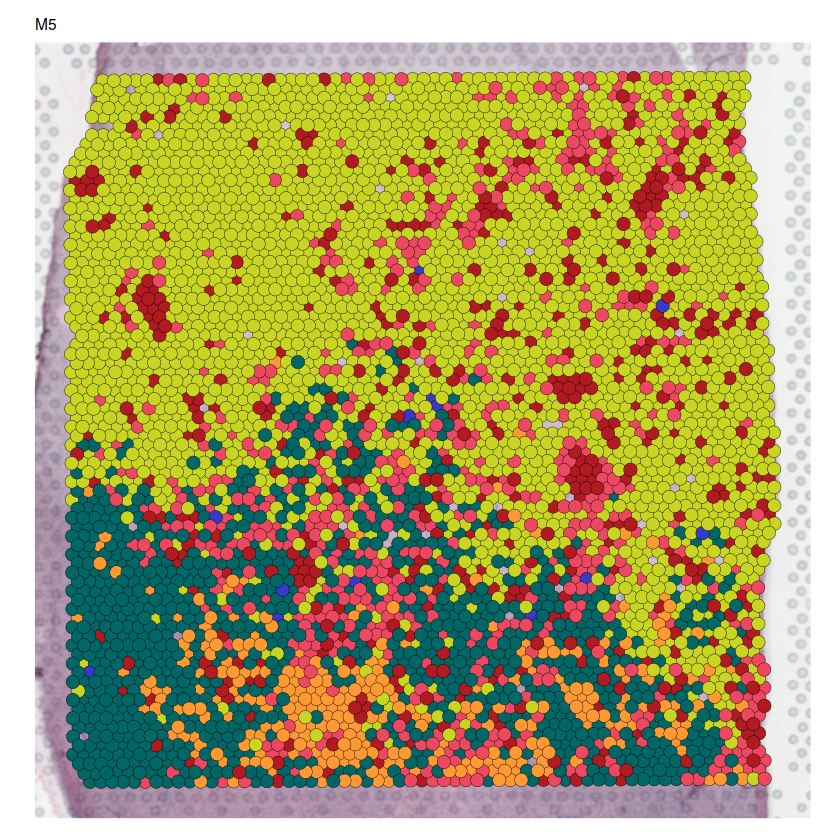

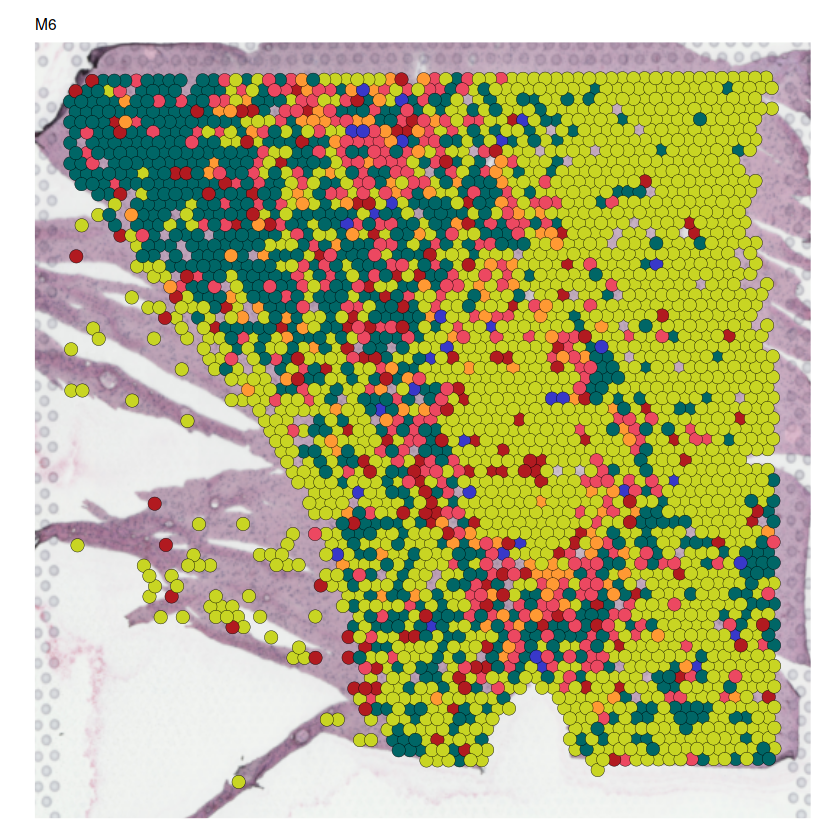

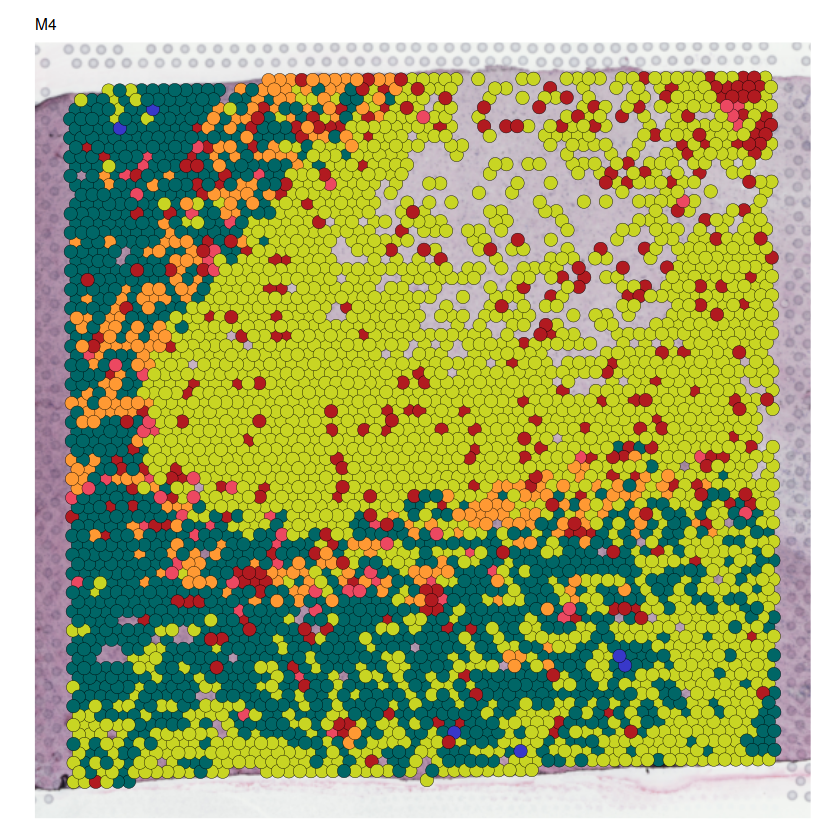

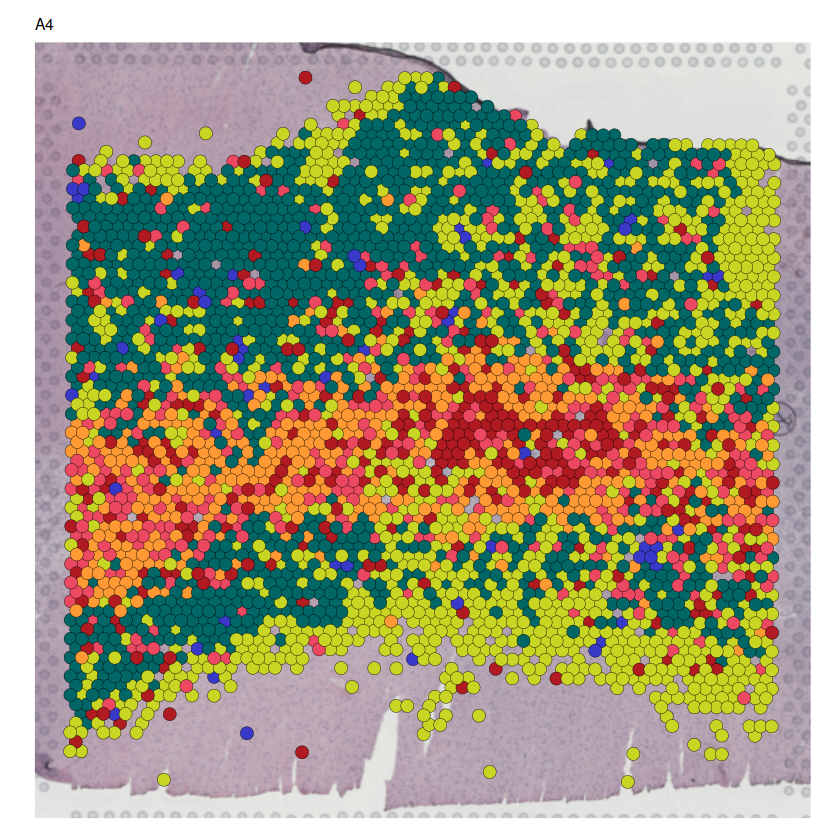

In [83]:
datasets$orig.ident <- paste(st.integrated$sample_ID, st.integrated$Group, sep = "_")
unique(datasets$orig.ident)

samples <- names(datasets@images)
length(samples)

ST_ID <- unique(datasets$manuscript_ID)
length(ST_ID)

plot_list = NULL
for (k in 1:length(samples)){
    sample <- as.character(samples[k])
    plot <- SpatialDimPlot(datasets, images = sample, 
                           group.by = "seurat_clusters", 
                           cols = ucols, 
                           pt.size.factor = 1.6,
                           alpha = c(1, 1),
                           image.alpha = 1,
                           stroke = 0.25,
                           combine = TRUE) 
    plot <- plot + NoLegend() + ggtitle(as.character(ST_ID[k])) + 
                   theme(plot.title = element_text(size = 9))
    plot_list[[k]] <- plot
    print(plot)
}

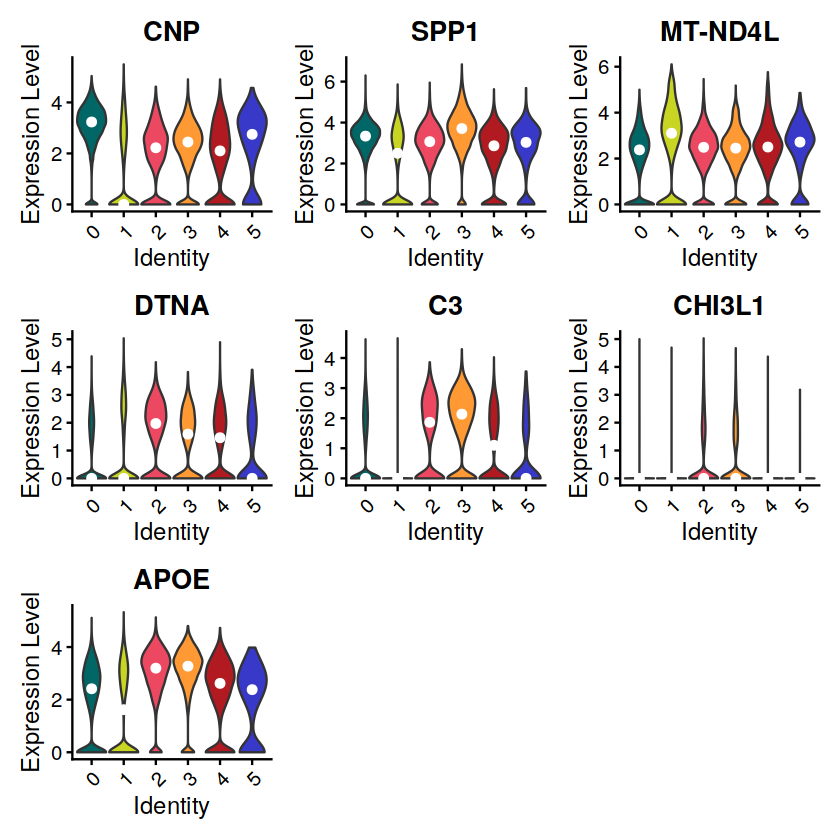

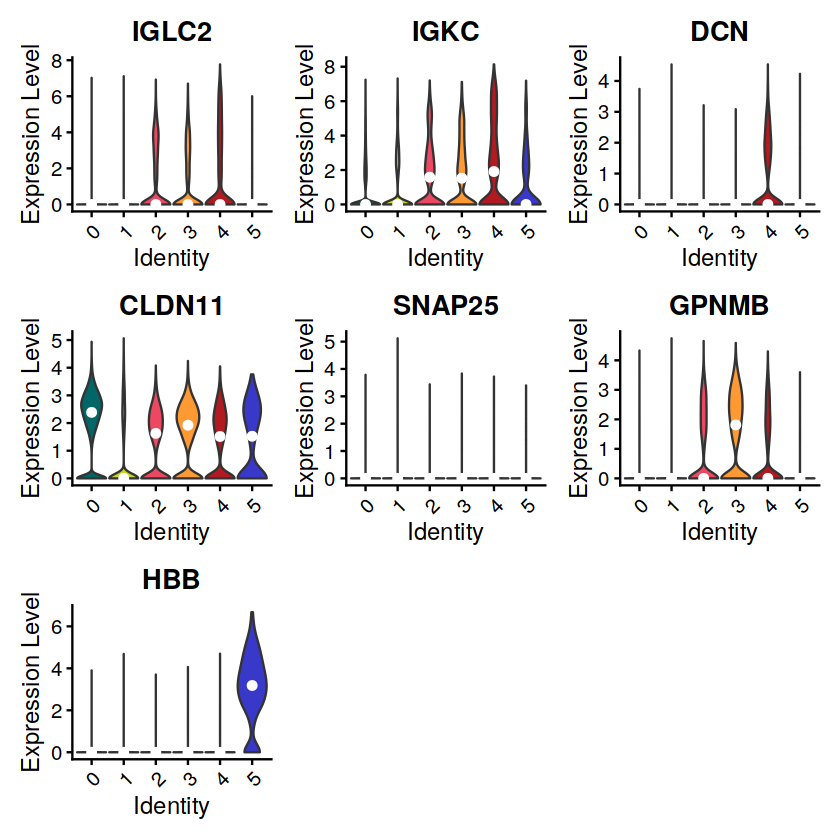

In [84]:
#-------------------------- Violins of lesion genes and important genes --------------------------
DefaultAssay(datasets) <- "Spatial"

p1 <- VlnPlot(datasets, features = c('CNP'), pt.size = 0, cols = ucols) + stat_summary(fun = median, geom = "point", size = 2, color = 'white') + NoLegend() #, 'APOE', 'GPNMB', "FTL"
p1a <- VlnPlot(datasets, features = c('SPP1'), pt.size = 0, cols = ucols) + stat_summary(fun = median, geom = "point", size = 2, color = 'white') + NoLegend() #, 'APOE', 'GPNMB', "FTL"
p2 <- VlnPlot(datasets, features = c('MT-ND4L'), pt.size = 0, cols = ucols) + stat_summary(fun = median, geom = "point", size = 2, color = 'white') + NoLegend() #, '', '', "FTL"
p3 <- VlnPlot(datasets, features = c('DTNA'), pt.size = 0, cols = ucols) + stat_summary(fun = median, geom = "point", size = 2, color = 'white') + NoLegend() #, '', '', "FTL"

p5 <- VlnPlot(datasets, features = c('C3'), pt.size = 0, cols = ucols) + stat_summary(fun = median, geom = "point", size = 2, color = 'white') + NoLegend()#, 'APOE', 'GPNMB', "FTL"
p6 <- VlnPlot(datasets, features = c('CHI3L1'), pt.size = 0, cols = ucols) + stat_summary(fun = median, geom = "point", size = 2, color = 'white') + NoLegend() 
p7 <- VlnPlot(datasets, features = c('APOE'), pt.size = 0, cols = ucols) + stat_summary(fun = median, geom = "point", size = 2, color = 'white') + NoLegend() 
# cluster 3
p8 <- VlnPlot(datasets, features = c('IGLC2'), pt.size = 0, cols = ucols) + stat_summary(fun = median, geom = "point", size = 2, color = 'white') + NoLegend() 
p9 <- VlnPlot(datasets, features = c('IGKC'), pt.size = 0, cols = ucols) + stat_summary(fun = median, geom = "point", size = 2, color = 'white') + NoLegend() 
p10 <- VlnPlot(datasets, features = c('DCN'), pt.size = 0, cols = ucols) + stat_summary(fun = median, geom = "point", size = 2, color = 'white') + NoLegend() 
# cluster 4
p11 <- VlnPlot(datasets, features = c('CLDN11'), pt.size = 0, cols = ucols) + stat_summary(fun = median, geom = "point", size = 2, color = 'white') + NoLegend() 
#cluster 5

p12 <- VlnPlot(datasets, features = c('SNAP25'), pt.size = 0, cols = ucols) + stat_summary(fun = median, geom = "point", size = 2, color = 'white') + NoLegend() 
p13 <- VlnPlot(datasets, features = c('GPNMB'), pt.size = 0, cols = ucols) + stat_summary(fun = median, geom = "point", size = 2, color = 'white') + NoLegend() 
# cluster6
p14 <- VlnPlot(datasets, features = c('HBB'), pt.size = 0, cols = ucols) + stat_summary(fun = median, geom = "point", size = 2, color = 'white') + NoLegend() 


wrap_plots(p1, p1a, p2, p3, p5, p6, p7, ncol = 3)
wrap_plots(p8, p9, p10, p11, p12, p13, p14, ncol = 3) 

In [ ]:
# plotting proportions: is there a CWM/NAWM enriched cluster? Is there a lesion-enriched cluster?
my_plot <- function(df, var, my_breaks, my_lims) {
  ggplot(data = df, aes(x = group, y = percentage, fill = group)) +
    facet_grid(~ {{var}}) +
    geom_boxplot(alpha = 1) +
    geom_point(shape = 21, size = 4) +
    scale_fill_manual(values = group_cols) +
    theme_classic() +
    theme(text = element_text(hjust = 0.5, face = "plain", size = (16)),
                    axis.text.x = element_blank(),
                    axis.ticks.x = element_blank(), 
                    plot.title = element_text(hjust = 0.5, face = "plain", size = (16)),
                    axis.title.y = element_text(face = "plain", size = (16)),
                    axis.text = element_text(size = (16), colour = "black"),
                    plot.subtitle = element_text(hjust = 0.5),
                    panel.background = element_blank(),
                    panel.border = element_blank(),
                    panel.grid.major = element_blank(), 
                    panel.grid.minor = element_blank(),
                    panel.grid = element_blank(),
                    axis.line = element_line(color = "black")
              ) +
    ylab("spots (%)") +
    NoLegend() +
    scale_y_continuous(breaks = {{my_breaks}}, limits = {{my_lims}})+
    expand_limits(y = 0)
}


p0 <- dg %>% filter(cluster == "0") %>% my_plot(var = "0", my_breaks = c(0, 20, 40, 60), my_lims = c(0, 75))
p1 <- dg %>% filter(cluster == "1") %>% my_plot(var = "1", my_breaks = c(0, 20, 40, 60), my_lims = c(0, 75))
p2 <- dg %>% filter(cluster == "2") %>% my_plot(var = "2", my_breaks = c(0, 20, 40), my_lims = c(0, 40))
p3 <- dg %>% filter(cluster == "3") %>% my_plot(var = "3", my_breaks = c(0, 5, 10, 15, 20), my_lims = c(0, 20))
p4 <- dg %>% filter(cluster == "4") %>% my_plot(var = "4", my_breaks = c(0, 5, 10, 15, 20), my_lims = c(0, 20))
p5 <- dg %>% filter(cluster == "5") %>% my_plot(var = "5", my_breaks = c(0, 1, 2, 3), my_lims = c(0, 3))

pdf('Routput/Seurat/Clustering/boxplot_proportions.pdf')
p0+p1+p2+p3+p4+p5+plot_layout(ncol = 3)
dev.off()

png 
  2

In [125]:
saveRDS(datasets, file = paste0("./RData/seurat/3.WM.clustered.res", res, ".rds"))

In [1]:
sessionInfo()

R version 4.2.0 (2022-04-22)
Platform: x86_64-conda-linux-gnu (64-bit)
Running under: Ubuntu 20.04.5 LTS

Matrix products: default
BLAS/LAPACK: /data/bcn/p283607/anaconda3/envs/R4.2/lib/libopenblasp-r0.3.21.so

locale:
 [1] LC_CTYPE=en_US.UTF-8       LC_NUMERIC=C              
 [3] LC_TIME=en_US.UTF-8        LC_COLLATE=en_US.UTF-8    
 [5] LC_MONETARY=en_US.UTF-8    LC_MESSAGES=en_US.UTF-8   
 [7] LC_PAPER=en_US.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=en_US.UTF-8 LC_IDENTIFICATION=C       

attached base packages:
[1] stats     graphics  grDevices utils     datasets  methods   base     

loaded via a namespace (and not attached):
 [1] fansi_1.0.6     crayon_1.5.2    digest_0.6.33   utf8_1.2.4     
 [5] IRdisplay_1.1   repr_1.1.4      lifecycle_1.0.4 jsonlite_1.8.7 
 [9] evaluate_0.23   pillar_1.9.0    rlang_1.1.3     cli_3.6.2      
[13] uuid_1.1-0      vctrs_0.6.5     IRkernel_1.3.1  tools_4.2.0    
[17] glu